# Test network
## 1. Train

This part is the whole training process for test network.

After training our parent network (50000 iterations), we get the checkpoints of our parent network model as the initial checkpoints for our test network. Then we finished training for 500 iterations.

As an example, we finetune and test the image sequence shown as Figure 1 in the paper, which is called "parkour" in Davis dataset. The process for other sequences are absolutely the same.

In [ ]:
import os
os.kill(os.getpid(), 9)

In [ ]:
%tensorflow_version 1.13

`%tensorflow_version` only switches the major version: 1.x or 2.x.
You set: `1.13`. This will be interpreted as: `1.x`.


TensorFlow 1.x selected.


In [ ]:
import tensorflow as tf
tf.__version__

'1.15.2'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip -q '/content/drive/My Drive/models.zip' -d '/content'

In [ ]:
!unzip -q '/content/drive/My Drive/DAVIS.zip' -d '/content'

### Load data

In [ ]:
import os
from data_finetune import load_data_finetune

# Choose image sequence for finetuning 
seq_name = "parkour"
train_model = True

# Define Dataset
test_frames = sorted(os.listdir(os.path.join('DAVIS', 'JPEGImages', '480p', seq_name)))
test_imgs = [os.path.join('DAVIS', 'JPEGImages', '480p', seq_name, frame) for frame in test_frames]
train_imgs = [os.path.join('DAVIS', 'JPEGImages', '480p', seq_name, '00000.jpg')+' '+ 
              os.path.join('DAVIS', 'Annotations', '480p', seq_name, '00000.png')]
dataset = load_data_finetune(train_imgs, test_imgs, './', data_aug=True)

Start loading files:
Performing the data augmentation
Finish loading Dataset


### Train the network

In [ ]:
import sys
import os
from PIL import Image
import numpy as np
import tensorflow as tf
slim = tf.contrib.slim
import matplotlib.pyplot as plt
from train_finetune import train_finetune

# Import OSVOS files
root_folder = os.path.dirname(os.path.realpath('__file__'))
sys.path.append(os.path.abspath(root_folder))
os.chdir(root_folder)
import cnn

gpu_id = 0
# Train parameters
parent_path = os.path.join('models', 'OSVOS_parent', 'OSVOS_parent.ckpt-50000')
logs_path = os.path.join('models', seq_name)
max_training_iters = 500
    
if train_model:
    # More training parameters
    learning_rate = 1e-8
    save_step = max_training_iters
    side_supervision = 3
    display_step = 10
    with tf.Graph().as_default():
        with tf.device('/gpu:' + str(gpu_id)):
            global_step = tf.Variable(0, name='global_step', trainable=False)
            train_finetune(dataset, parent_path, side_supervision, learning_rate, logs_path, max_training_iters,
                                 save_step, display_step, global_step, iter_mean_grad=1, ckpt_name=seq_name)

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.






Instructions for updating:
Please use `layer.__call__` method instead.
Instructions for updating:
Deprecated in favor of operator or tf.math.divide.








Init variable



Initializing from specified pre-trained model...

INFO:tensorflow:Restoring parameters from models/OSVOS_parent/OSVOS_parent.ckpt-50000

Weights initialized
Start training


2020-12-18 05:28:51.081172 Iter 10: Training Loss = 120.3940
2020-12-18 05:28:52.010155 Iter 20: Training Loss = 108.9817
2020-12-18 05:28:52.899851 Iter 30: Training Loss = 100.5356
2020-12-18 05:28:53.819830 Iter 40: Training Loss = 103.4424
2020-12-18 05:28:54.604503 Iter 50: Training Loss = 58.1818
2020-12-18 05:28:55.562715 Iter 60: Training Loss = 97.5383
2020-12-18 05:28:56.484398 Iter 70: Training Loss = 94.0702
2020-12-18 05:28:57.304069 Iter 80: Training Loss = 55.1184
2020-12-18 05:28:58.232034 Iter 90: Training Loss = 85.0043
2020-12-18 05:28:59.082151 Iter 100: Training Loss = 82.6339
2020-12-18 05:28:59.936596 Iter 110: Training Loss = 53.1292
2020-12-18 05:29:00.899466 Iter 120: Training Loss = 80.3953
2020-12-18 05:29:01.728737 Iter 130: Training Loss = 46.7446
2020-12-18 05:29:02.690576 Iter 140: Training Loss = 79.2802
2020-12-18 05:29:03.591399 Iter 150: Training Loss = 50.6800
2020-12-18 05:29:04.481370 Iter 160: Training Loss = 73.3125
2020-12-18 05:29:05.368263 It

INFO:tensorflow:models/parkour/parkour.ckpt-500 is not in all_model_checkpoint_paths. Manually adding it.
Model saved in file: models/parkour/parkour.ckpt-500
Finished training.


### Tensorboard graph

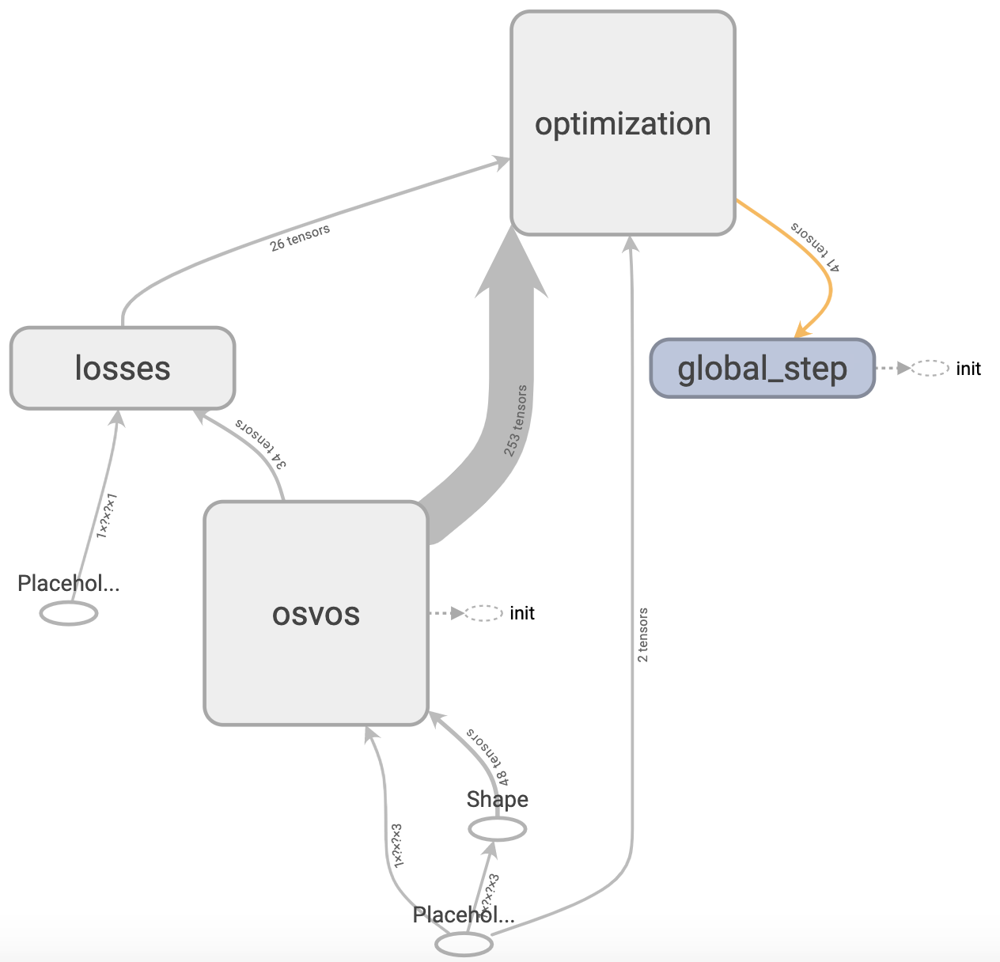

### Loss

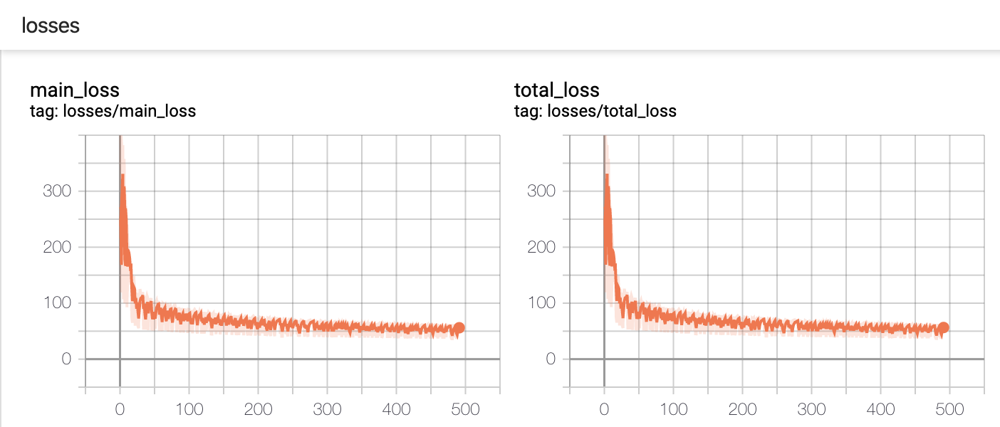

## 2. Test

This part is the test for test network on sequence "parkour".

In [ ]:
# Test the network
from test_finetune import test
result_path = os.path.join('DAVIS', 'Results', 'Segmentations', '480p', 'OSVOS', seq_name)
with tf.Graph().as_default():
    with tf.device('/gpu:' + str(gpu_id)):
        checkpoint_path = os.path.join('models', seq_name, seq_name+'.ckpt-'+str(max_training_iters))
        test(dataset, checkpoint_path, result_path)

INFO:tensorflow:Restoring parameters from models/parkour/parkour.ckpt-500
Saving DAVIS/Results/Segmentations/480p/OSVOS/parkour/00000.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/parkour/00001.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/parkour/00002.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/parkour/00003.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/parkour/00004.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/parkour/00005.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/parkour/00006.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/parkour/00007.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/parkour/00008.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/parkour/00009.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/parkour/00010.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/parkour/00011.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/parkour/00012.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/parkour/00013.png
Saving DAVIS/Results/Segmentat

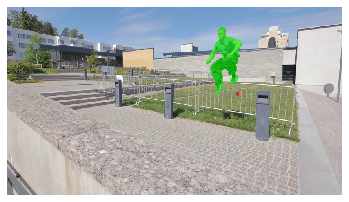

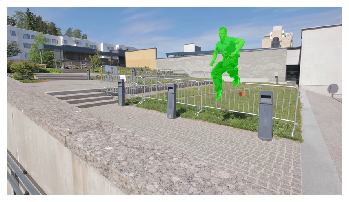

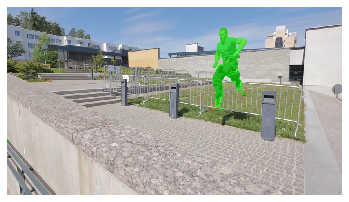

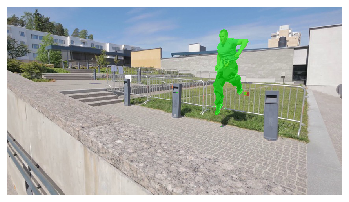

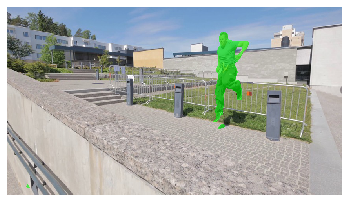

...

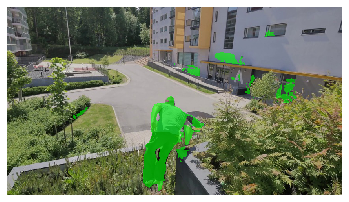

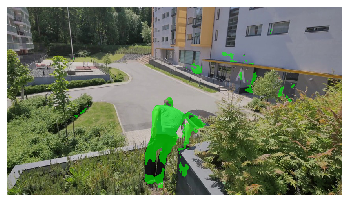

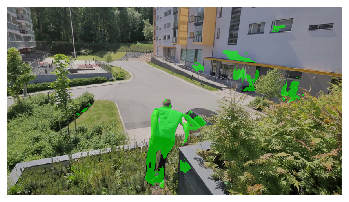

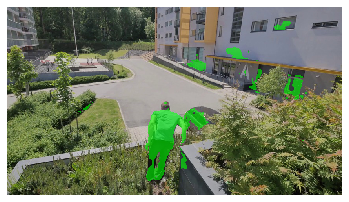

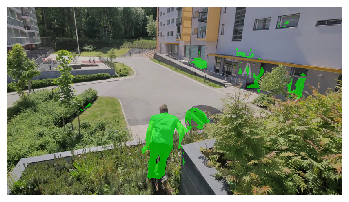

<Figure size 432x288 with 0 Axes>

In [ ]:
# Show results
overlay_color = [0, 255, 0]
transparency = 0.6
plt.ion()
for img_p in test_frames:
    frame_num = img_p.split('.')[0]
    img = np.array(Image.open(os.path.join('DAVIS', 'JPEGImages', '480p', seq_name, img_p)))
    mask = np.array(Image.open(os.path.join(result_path, frame_num+'.png')))
    mask = mask//np.max(mask)
    im_over = np.ndarray(img.shape)
    im_over[:, :, 0] = (1 - mask) * img[:, :, 0] + mask * (overlay_color[0]*transparency + (1-transparency)*img[:, :, 0])
    im_over[:, :, 1] = (1 - mask) * img[:, :, 1] + mask * (overlay_color[1]*transparency + (1-transparency)*img[:, :, 1])
    im_over[:, :, 2] = (1 - mask) * img[:, :, 2] + mask * (overlay_color[2]*transparency + (1-transparency)*img[:, :, 2])
    plt.imshow(im_over.astype(np.uint8))
    plt.axis('off')
    plt.show()
    plt.pause(0.01)
    plt.clf()

In [ ]:
# Calculate accuracy
import cv2

num = np.size(test_frames)
acc = np.zeros(num)
groundtruth_path = os.path.join('DAVIS', 'Annotations', '480p', seq_name)
i = 0

for img_p in test_frames:
    frame_num = img_p.split('.')[0]
    mask = np.array(Image.open(os.path.join(result_path, frame_num+'.png')))
    mask = mask//np.max(mask)
    groundtruth = np.array(Image.open(os.path.join(groundtruth_path, frame_num+'.png')))
    groundtruth = groundtruth//np.max(groundtruth)
    AND = cv2.bitwise_and(mask, groundtruth)
    OR = cv2.bitwise_or(mask, groundtruth)
    a = np.sum(AND == 1)
    o = np.sum(OR == 1)
    J = a/o * 100
    acc[i] = J
    i += 1
    
# Mean for all frames
accuracy = np.mean(acc)
print('Accuracy:')
print('%s%%'%(accuracy))
    

Accuracy:
80.9866672180294%
